In [2]:
# Import libraries and dependencies
import numpy as np
import pandas as pd
import os
from pandas.plotting import table 
from datetime import datetime, timedelta
import matplotlib.pyplot as plt
import alpaca_trade_api as tradeapi
%matplotlib inline
import hvplot.pandas

In [3]:
np.random.seed(42)

# Portfolio Planner

In this activity, you will use the Alpaca api to grab historical data for a 60/40 portfolio using `SPY` to represent the stock portion and `AGG` to represent the bonds.

In [4]:
# Load .env enviroment variables
from dotenv import load_dotenv
load_dotenv()

# Set Alpaca API key and secret
alpaca_api_key = os.getenv("ALPACA_API_KEY")
alpaca_secret_key = os.getenv("ALPACA_SECRET_KEY")

api = tradeapi.REST(alpaca_api_key, alpaca_secret_key, api_version='v2')

# Data Collection

In this step, you will need to use the Alpaca api to fetch closing prices for the `SPY` and `AGG` tickers. Save the results as a pandas DataFrame

In [5]:
tickers = ["SPY", "AGG"]
timeframe = '1D'

end = datetime.now()
start = end + timedelta(-365)
start_date = pd.Timestamp(start, tz='America/New_York').isoformat()
end_date = pd.Timestamp(end, tz='America/New_York').isoformat()

stock_prices = api.get_barset(
    tickers,
    timeframe,
    limit=None,
    start=start_date,
    end=end_date,
    after=None,
    until=None,
).df

stock_prices.drop(columns=['open', 'high', 'low', 'volume'], level=1, inplace=True)
stock_prices.index = stock_prices.index.date
stock_prices.head()




,AGG,SPY
,close,close
2019-04-25,108.490,292.08
2019-04-26,108.690,293.44
2019-04-29,108.520,293.78
2019-04-30,108.585,293.96
2019-05-01,108.390,291.84


# Monte Carlo Simulation

In this step, you will run Monte Carlo Simulations for your portfolio to model portfolio performance at different retirement ages. 

Complete the following steps:
1. Calculate the daily returns for the SPY and AGG closing prices.
2. Calculate volatility for both the SPY and AGG closing prices.
3. Find the last day's closing price for both stocks and save those as variables.
4. Run a Monte Carlo Simulation of at least 500 iterations and generate at least 30 years of closing prices

### HINTS:
There are 252 trading days per year, so the number of records to generate for each Monte Carlo run will be 252 days * 30 years

C:\Users\drbri\Anaconda3\lib\site-packages\pandas\plotting\_converter.py:129: FutureWarning: Using an implicitly registered datetime converter for a matplotlib plotting method. The converter was registered by pandas on import. Future versions of pandas will require you to explicitly register matplotlib converters.

To register the converters:
	>>> from pandas.plotting import register_matplotlib_converters
	>>> register_matplotlib_converters()
  warnings.warn(msg, FutureWarning)


Text(0.5, 0.98, 'Historical asset performance')

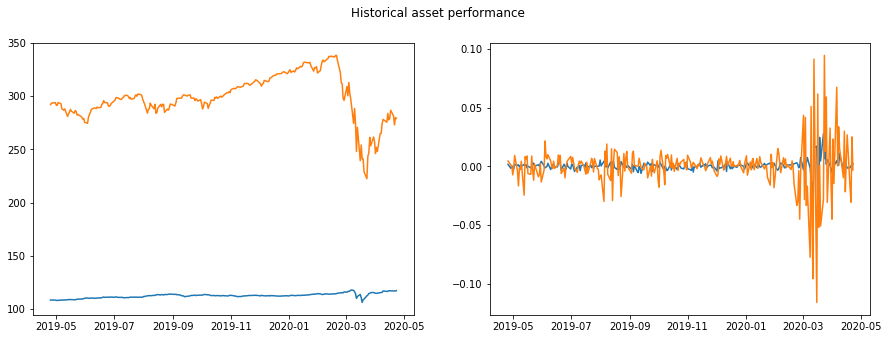

In [6]:
# Calculate the daily roi for the stocks
stock_returns=stock_prices.pct_change()
# stock_prices.plot()
# stock_returns.plot()

fig, axs = plt.subplots(1,2, figsize=(15, 5), sharex=True)
axs[0].plot(stock_prices)
axs[1].plot(stock_returns)
fig.suptitle('Historical asset performance')         
# fig.savefig('./output/AGG_ret.png', bbox_inches='tight', dpi=150)


In [7]:
AGG_mean=stock_returns['AGG']['close'].dropna().mean()
SPY_mean=stock_returns['SPY']['close'].dropna().mean()
AGG_mean


0.00032979537090337856

In [8]:
# Calculate volatility
AGG_std=stock_returns['AGG']['close'].dropna().std()
SPY_std=stock_returns['SPY']['close'].dropna().std()
AGG_std

0.005575769358863829

In [9]:
# Save the last day's closing price
AGG_price=stock_returns['AGG']['close'][-1]
SPY_price=stock_returns['SPY']['close'][-1]

In [10]:
# Setup the Monte Carlo Parameters
number_simulations = 500
number_records = 252 * 30
monte_carlo = pd.DataFrame()

In [41]:
# Run the Monte Carlo Simulation
simulated_price = pd.DataFrame()
cum_port_ret = pd.DataFrame()
weights=[.4,.6]
for x in range(number_simulations):
    AGG_sim=[AGG_price]
    SPY_sim=[SPY_price]
    for y in range(number_records):
        AGG_sim_price = AGG_sim[-1] * (1 + np.random.normal(AGG_mean, AGG_std))
        AGG_sim.append(AGG_sim_price)
        
        SPY_sim_price = SPY_sim[-1] * (1 + np.random.normal(SPY_mean, SPY_std))
        SPY_sim.append(SPY_sim_price)
        
    simulated_price["AGG"] = pd.Series(AGG_sim)
    simulated_price["SPY"] = pd.Series(SPY_sim)
    
    simulated_ret = simulated_price.pct_change()
    portfolio_rets = simulated_ret.dot(weights)
    
    cum_port_ret[x+1] = (1 + portfolio_rets.fillna(0)).cumprod()
    
cum_port_ret.tail()

        
    
    

,1,2,3,4,5,6,7,8,9,10,...,491,492,493,494,495,496,497,498,499,500
7556,1.409809,1.393552,0.342919,2.576392,0.352315,0.885200,0.540528,2.292240,2.315665,1.109163,...,2.678197,16.327105,0.312597,0.289130,4.574986,5.794635,1.889455,3.682821,0.580826,0.755747
7557,1.410988,1.404795,0.341084,2.571245,0.351059,0.897889,0.531421,2.343308,2.351563,1.124194,...,2.665481,16.317327,0.315580,0.291825,4.537503,5.839481,1.892370,3.598664,0.567649,0.756258
7558,1.414697,1.417456,0.340923,2.607965,0.350506,0.902579,0.522621,2.320417,2.364974,1.132070,...,2.709452,16.461166,0.317401,0.296424,4.478364,5.794754,1.928117,3.579857,0.567650,0.759323
7559,1.380980,1.422812,0.340926,2.622029,0.356251,0.912217,0.511455,2.368220,2.413392,1.132626,...,2.678249,16.522281,0.324573,0.294570,4.480657,5.842493,1.936944,3.686482,0.574942,0.772286
7560,1.397605,1.418802,0.340904,2.601843,0.362953,0.910643,0.512192,2.387084,2.391137,1.120496,...,2.677800,16.761322,0.322418,0.299710,4.566283,5.703039,1.935823,3.626798,0.575275,0.754895


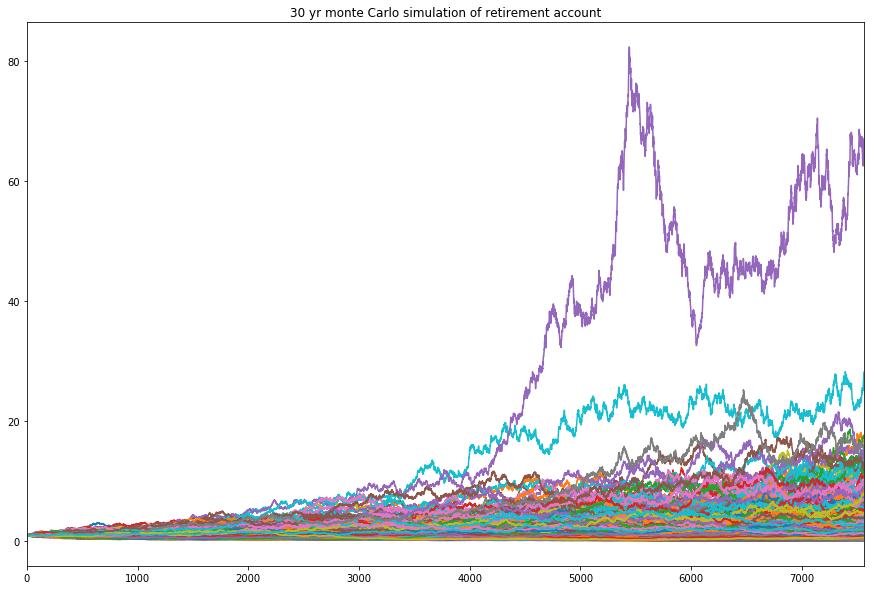

In [12]:
# Visualize the Simulation
fig=cum_port_ret.plot(figsize=(15,10),legend=False, title='30 yr monte Carlo simulation of retirement account')
# fig.figure.savefig('./output/montecarlo.png', bbox_inches='tight', dpi=150)

In [55]:
# Select the last row for the cumulative returns (cumulative returns at 30 years)
yr30_returns = cum_port_ret.iloc[-1, :]
yr30_returns.head()

1    1.397605
2    1.418802
3    0.340904
4    2.601843
5    0.362953
Name: 7560, dtype: float64

In [14]:
# Select the last row for the cumulative returns (cumulative returns at 20 years)
yr20_returns = cum_port_ret.iloc[(20*252-1), :]
yr20_returns.head()

1    1.429717
2    1.174454
3    0.868748
4    0.648111
5    3.404490
Name: 5039, dtype: float64

In [15]:
# Display the 90% confidence interval for the ending returns
confidence_interval = yr30_returns.quantile(q=[0.05, 0.95])
confidence_interval
# fig, ax=plt.subplots(1,1)
# ax.xaxis.set_visible(False) 
# ax.yaxis.set_visible(False) 
# ax.set_frame_on(False) 
# table(ax, confidence_interval,rowLabels=['']*confidence_interval.shape[0],loc='center')
# fig.savefig('./output/confidence.png')



0.05    0.326944
0.95    9.459456
Name: 7560, dtype: float64

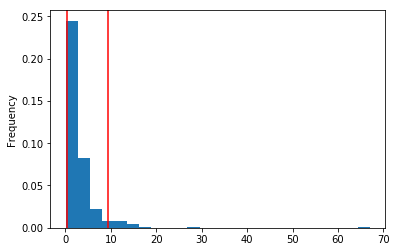

In [16]:
# Visualize the distribution of the ending returns
plt.figure();
yr30_returns.plot(kind='hist', density=True, bins=25)
plt.axvline(confidence_interval.iloc[0], color='r')
plt.axvline(confidence_interval.iloc[1], color='r')
# plt.savefig('./output/density_plot.png', bbox_inches='tight', dpi=150)

---

# Retirement Analysis

In this section, you will use the monte carlo model to answer the following retirement planning questions:

1. What are the expected cumulative returns at 30 years for the 10th, 50th, and 90th percentiles?
2. Given an initial investment of `$20,000`, what is the expected portfolio return in dollars at the 10th, 50th, and 90th percentiles?
3. Given the current projected annual income from the Plaid analysis, will a 4% withdraw rate from the retirement portfolio meet or exceed that value at the 10th percentile?
4. How would a 50% increase in the initial investment amount affect the 4% retirement withdrawal?

### What are the expected cumulative returns at 30 years for the 10th, 50th, and 90th percentiles?

In [17]:
print(f'An initial $20,000 investment, at the 10th percentile, after 30 years is expected to be ${(20000*yr30_returns.quantile(0.1)):.2f} or a {((yr30_returns.quantile(0.1)-1)*100):.2f}% ROI')
print(f'An initial $20,000 investment, at the 50th percentile, after 30 years is expected to be ${(20000*yr30_returns.quantile(0.5)):.2f} or a {((yr30_returns.quantile(0.5)-1)*100):.2f}% ROI')
print(f'An initial $20,000 investment, at the 90th percentile, after 30 years is expected to be ${(20000*yr30_returns.quantile(0.9)):.2f} or a {((yr30_returns.quantile(0.9)-1)*100):.2f}% ROI')

An initial $20,000 investment, at the 10th percentile, after 30 years is expected to be $9376.38 or a -53.12% ROI
An initial $20,000 investment, at the 50th percentile, after 30 years is expected to be $35742.10 or a 78.71% ROI
An initial $20,000 investment, at the 90th percentile, after 30 years is expected to be $122513.69 or a 512.57% ROI


In [18]:
# lst=[['10th', f'{(20000*yr30_returns.quantile(0.1)):.2f}',f'{((yr30_returns.quantile(0.1)-1)*100):.2f}%'],['50th', f'{(20000*yr30_returns.quantile(0.5)):.2f}',f'{((yr30_returns.quantile(0.5)-1)*100):.2f}%'],['90th', f'{(20000*yr30_returns.quantile(0.9)):.2f}',f'{((yr30_returns.quantile(0.9)-1)*100):.2f}%']]
# tble=pd.DataFrame(lst)
# tble.columns=['Percentile', 'Expected Value','ROI']
# tble
# fig, ax = plt.subplots(1,1)
# ax.xaxis.set_visible(False) 
# ax.yaxis.set_visible(False) 
# ax.set_frame_on(False) 
# table(ax, tble,loc='center')
# fig.savefig('./output/yields.png')

### Given an initial investment of `$20,000`, what is the expected portfolio return in dollars at the 10th, 50th, and 90th percentiles?

### Given the current projected annual income from the Plaid analysis, will a 4% withdraw rate from the retirement portfolio meet or exceed that value at the 10th percentile?

Note: This is effectively saying that 90% of the expected returns will be greater than the return at the 10th percentile, so this can help measure the uncertainty about having enough funds at retirement

In [19]:
yr30=yr30_returns.tolist()
i2=[]
i3=[]
for x in yr30:
    if (.04*20000*x)>=7389:
        i2.append(x)
    if (.04*30000*x)>=7389:
        i3.append(x)
print(f'the annual projected Plaid revenue is only met or exceeded in the top {(len(i2)/len(yr30))*100:.2f} percentile  of simulations with a $20000 investment')
print(f'the annual projected Plaid revenue is only met or exceeded in the top {(len(i3)/len(yr30))*100:.2f} percentile  of simulations with a $30000 investment')

the annual projected Plaid revenue is only met or exceeded in the top 5.40 percentile  of simulations with a $20000 investment
the annual projected Plaid revenue is only met or exceeded in the top 10.00 percentile  of simulations with a $30000 investment


Our current projected annual income from Plaid is 7389USD in gross revenues, and we want the value of our portfolio to be such that 4% withdrawl will either equal or exceed this value.  The value of our portfoliat at the 10th percentile of our 1000 monte carlo simulations, given an intial investment of 20,000USD will be worth 9266USD.  The total value of this portfolio is far below annual projected Plaid revenue, let alone a 4% withdrawl.  Based on our simulations, only the top 5.3% percentile will reach the require threshold.

### How would a 50% increase in the initial investment amount affect the 4% retirement withdrawal?

if we increase the initial investment to 30,000USD rather then 20,000USD, from our model, the threshold value of Plaid annual revenue is exceeded only in the top 9.8% of simulations at 30 years.  

### Optional Challenge

In this section, you will calculate and plot the cumulative returns for the median and 90% confidence intervals. This plot shows the expected cumulative returns for any given day between the first day and the last day of investment. 

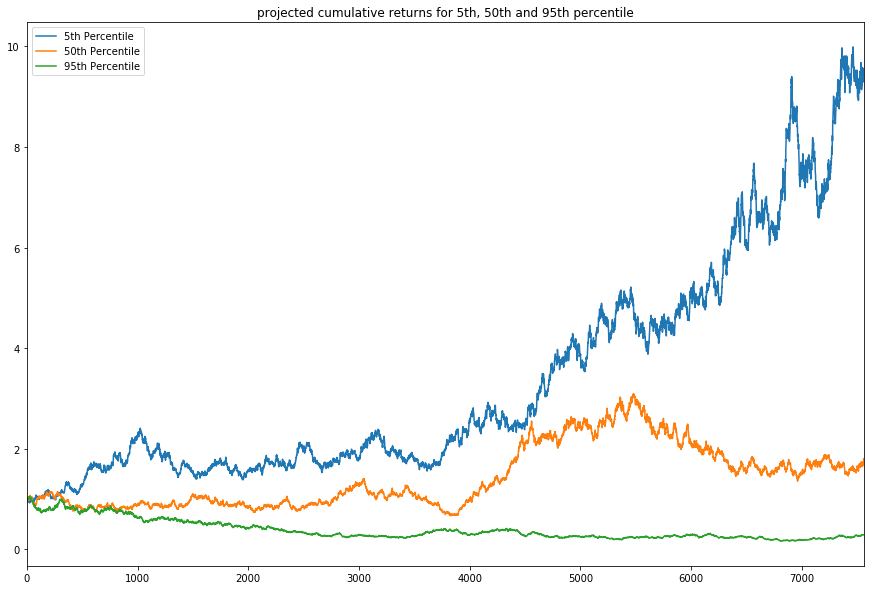

In [61]:
# YOUR CODE 
pct5=yr30_returns.quantile(0.05, interpolation='nearest')
pct50=yr30_returns.quantile(0.5,interpolation='nearest')
pct95=yr30_returns.quantile(0.95,interpolation='nearest')

df=cum_port_ret.T
mask=(df.iloc[:,-1]==pct5)|(df.iloc[:,-1]==pct50)|(df.iloc[:,-1]==pct95)
df2=df.loc[mask].T
df2.columns=['5th Percentile', '50th Percentile', '95th Percentile']
fig=df2.plot(figsize=(15,10), title='projected cumulative returns for 5th, 50th and 95th percentile')
# fig.figure.savefig('./output/Conf_cum_ret.png', bbox_inches='tight', dpi=150)


In [24]:
sims = 500
number = 252 * 5

monte_carlo = pd.DataFrame()
opt_sim= pd.DataFrame()
opt_cum_port = pd.DataFrame()

for weight in range(0,110,10):
    weights=[weight/100, (1-weight)/100]
    
    for x in range(sims):
        AGG_opt_sim=[AGG_price]
        SPY_opt_sim=[SPY_price]
        for y in range(number):
            AGG_opt_sim_price = AGG_opt_sim[-1] * (1 + np.random.normal(AGG_mean, AGG_std))
            AGG_opt_sim.append(AGG_opt_sim_price)
        
            SPY_opt_sim_price = SPY_opt_sim[-1] * (1 + np.random.normal(SPY_mean, SPY_std))
            SPY_opt_sim.append(SPY_opt_sim_price)
        
        opt_sim["AGG"] = pd.Series(AGG_opt_sim)
        opt_sim["SPY"] = pd.Series(SPY_opt_sim)
    
        opt_simulated_ret =opt_sim.pct_change()
        opt_portfolio_rets = opt_simulated_ret.dot(weights)
    
        opt_cum_port[f'{weight} wt AAG, sim {x+1}'] = (1 + opt_portfolio_rets.fillna(0)).cumprod()
    
opt_cum_port.tail()
    

,"0 wt AAG, sim 1","0 wt AAG, sim 2","0 wt AAG, sim 3","0 wt AAG, sim 4","0 wt AAG, sim 5","0 wt AAG, sim 6","0 wt AAG, sim 7","0 wt AAG, sim 8","0 wt AAG, sim 9","0 wt AAG, sim 10",...,"100 wt AAG, sim 491","100 wt AAG, sim 492","100 wt AAG, sim 493","100 wt AAG, sim 494","100 wt AAG, sim 495","100 wt AAG, sim 496","100 wt AAG, sim 497","100 wt AAG, sim 498","100 wt AAG, sim 499","100 wt AAG, sim 500"
1256,0.999348,0.994813,0.999902,1.006385,0.998098,0.997038,0.995687,1.003922,0.990519,0.999545,...,1.124720,2.135354,4.880516,2.899415,0.504181,0.364203,5.369412,0.426536,0.941926,1.966271
1257,0.999272,0.994858,0.999918,1.006253,0.998215,0.997034,0.995626,1.004172,0.990618,0.999417,...,1.124130,2.186119,5.018605,2.900226,0.494194,0.355037,5.418101,0.409797,0.907958,1.975001
1258,0.999258,0.994660,0.999959,1.006316,0.998153,0.997127,0.995299,1.004181,0.990890,0.999418,...,1.135277,2.085048,5.128271,2.844379,0.493536,0.359530,5.441647,0.407716,0.901971,1.994928
1259,0.998820,0.994639,1.000113,1.006409,0.998055,0.996752,0.995323,1.004106,0.991070,0.999339,...,1.144434,2.119698,5.099441,2.874209,0.493500,0.368471,5.395493,0.400139,0.912247,2.061978
1260,0.999073,0.994442,0.999815,1.006244,0.997497,0.996967,0.995689,1.004036,0.991360,0.999460,...,1.129313,2.127620,5.223696,2.865953,0.489570,0.365518,5.195532,0.398124,0.916652,2.042298


In [25]:
yr5_returns = opt_cum_port.iloc[-1, :]
yr5_returns.head()

0 wt AAG, sim 1    0.999073
0 wt AAG, sim 2    0.994442
0 wt AAG, sim 3    0.999815
0 wt AAG, sim 4    1.006244
0 wt AAG, sim 5    0.997497
Name: 1260, dtype: float64

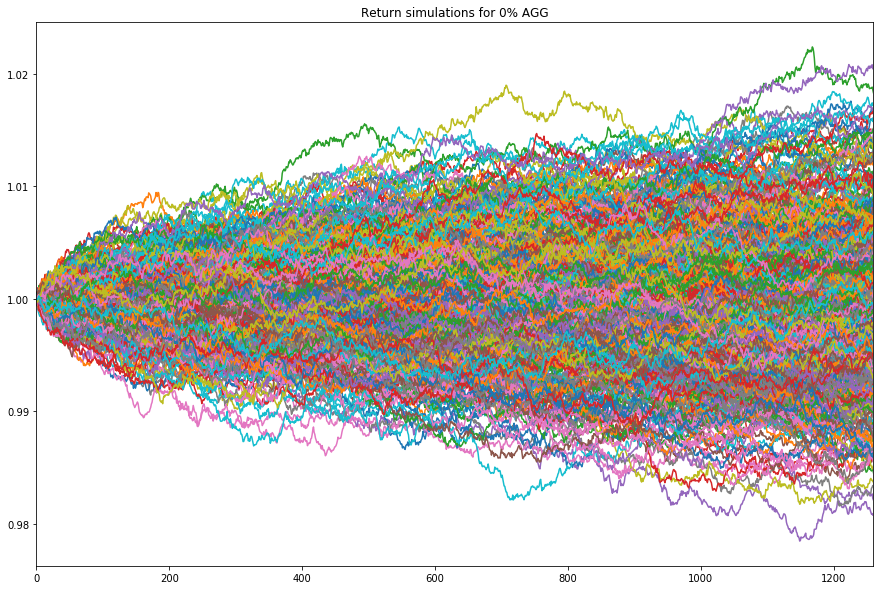

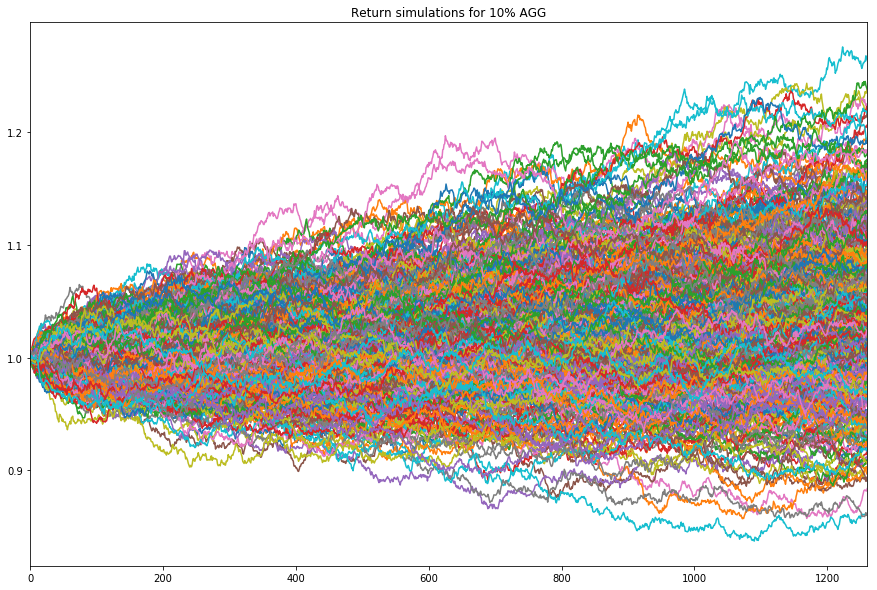

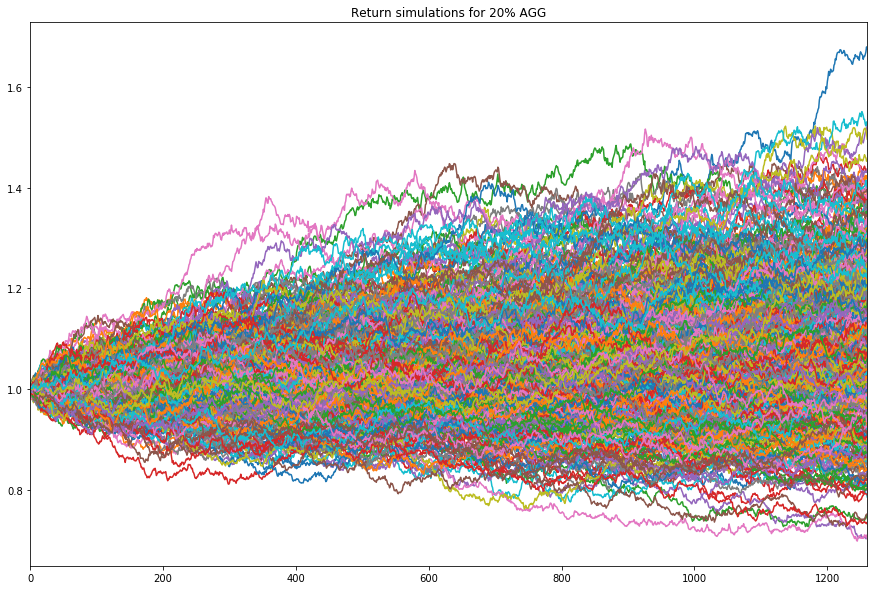

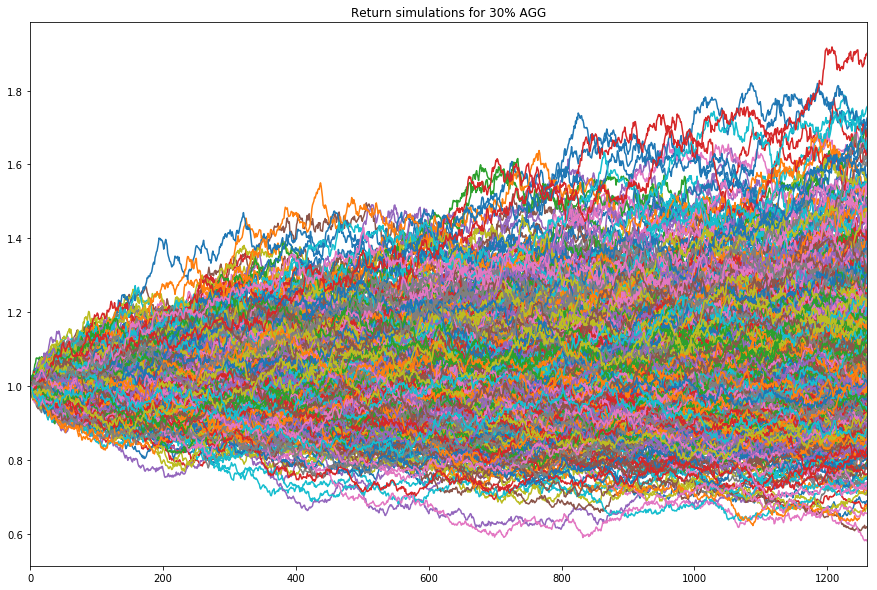

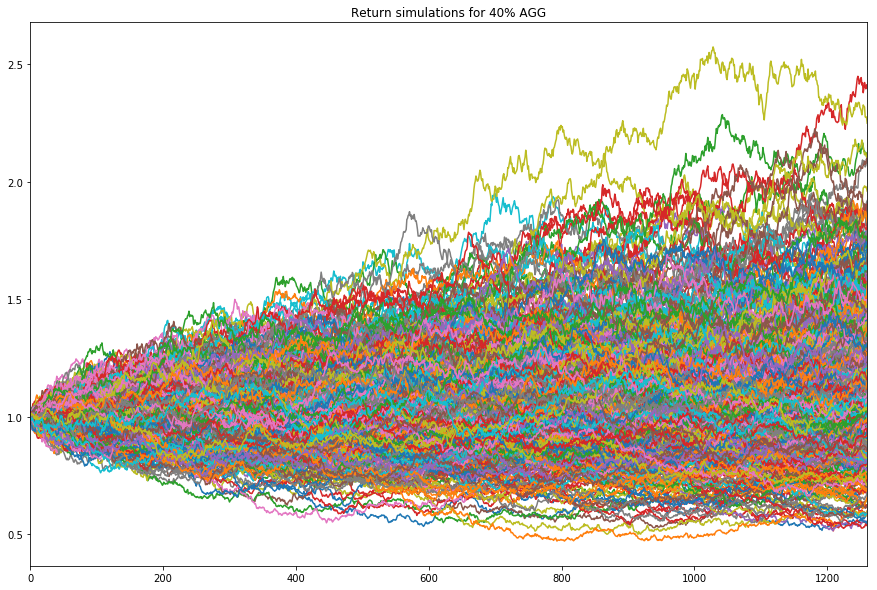

...

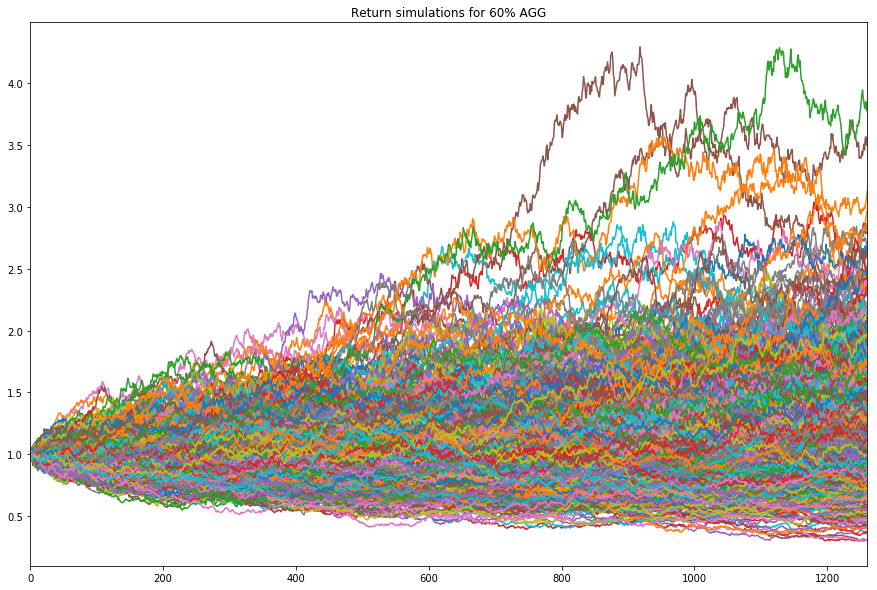

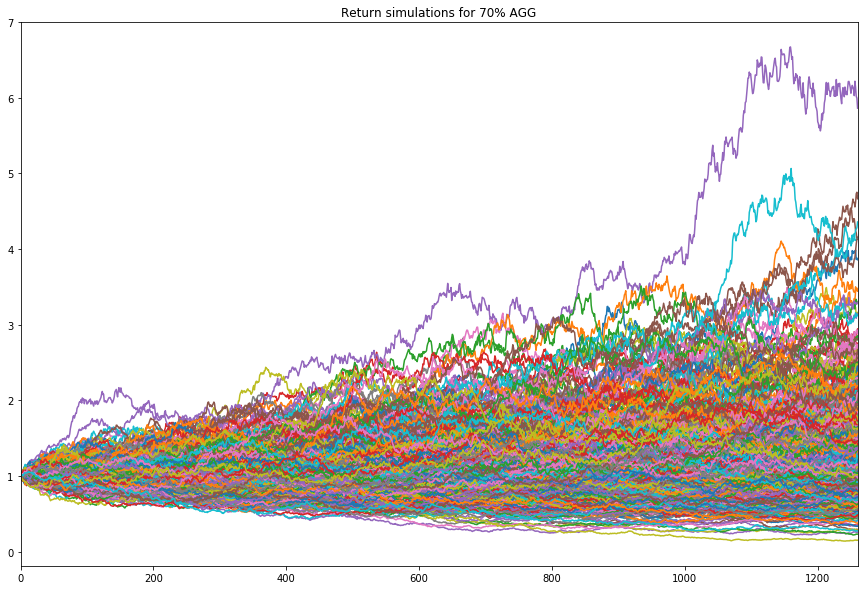

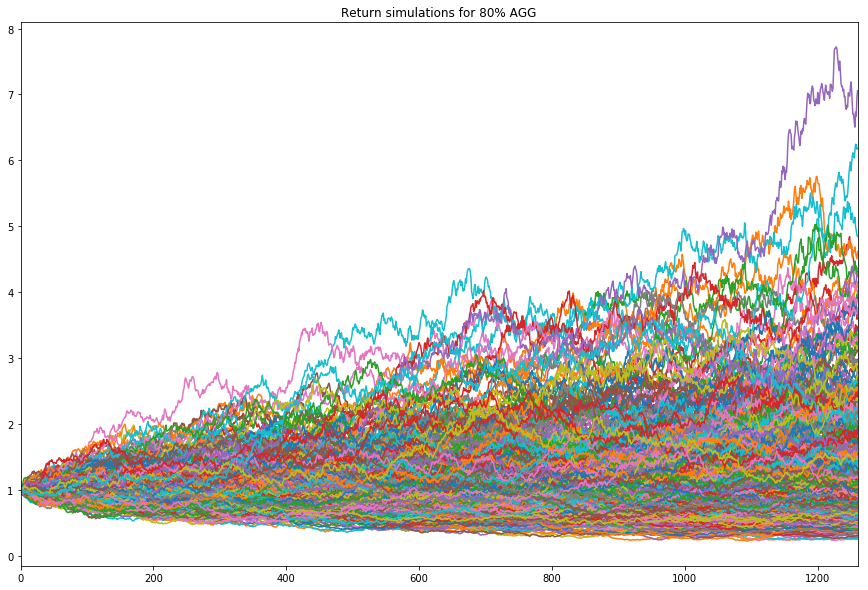

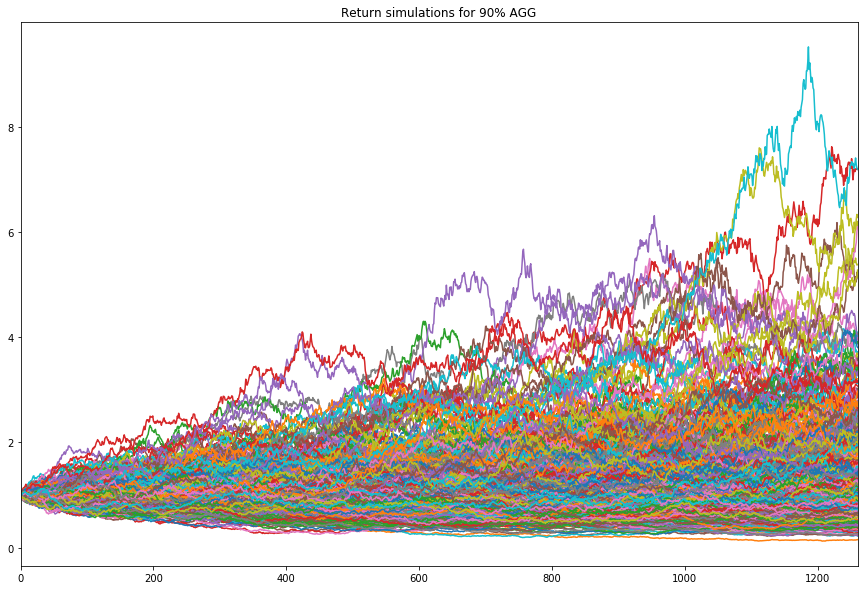

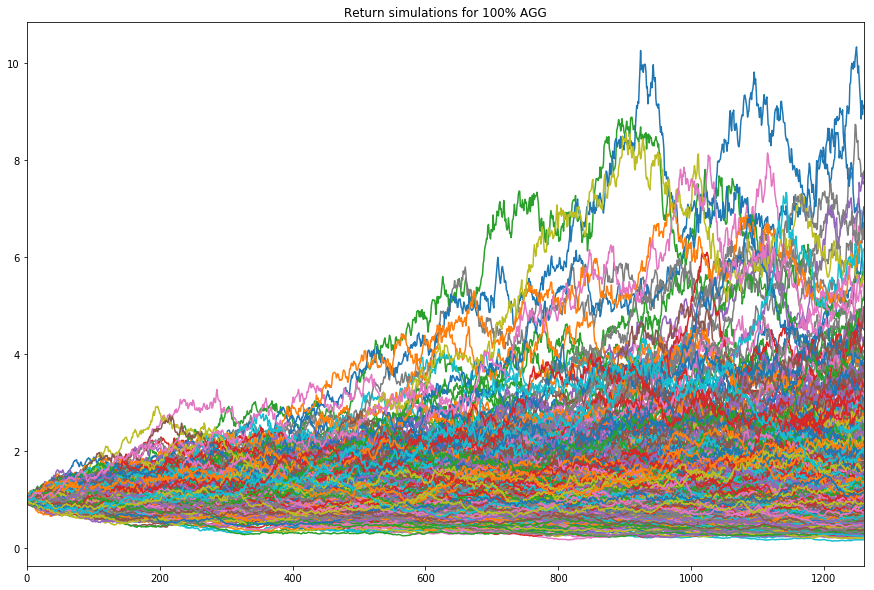

In [31]:
i=0
for x in range(0,5500,500):
    fig=opt_cum_port.iloc[:,x:x+500].plot(figsize=(15,10), legend=False,title=f'Return simulations for {i}% AGG')
#     fig.figure.savefig(f'./output/Optmontecarlo{i}.png', bbox_inches='tight', dpi=150)    
    i+=10


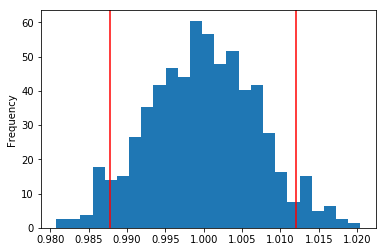

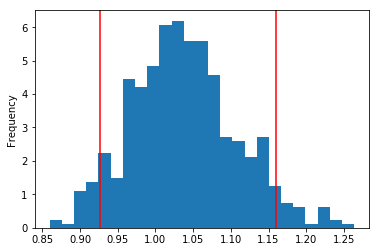

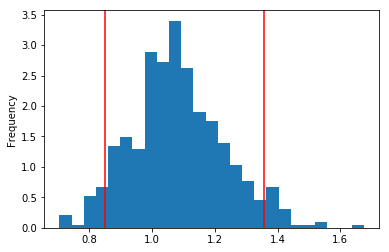

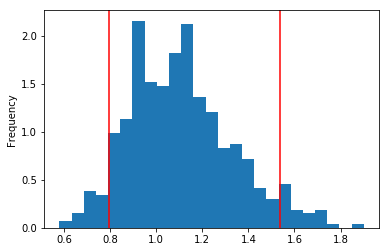

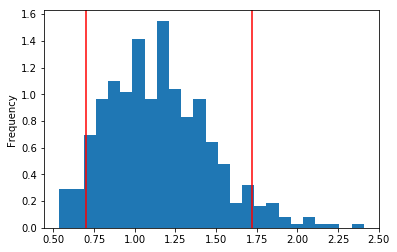

...

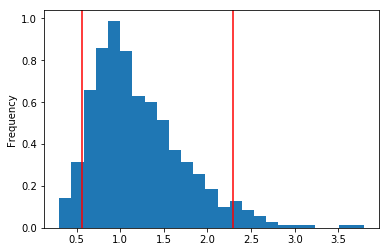

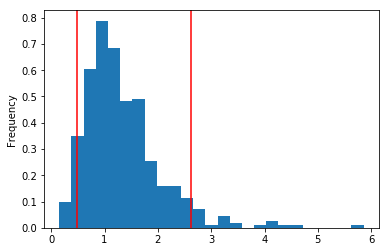

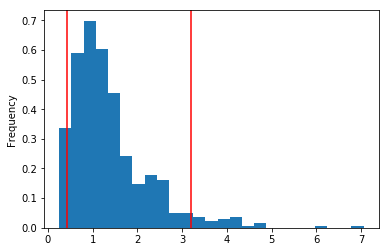

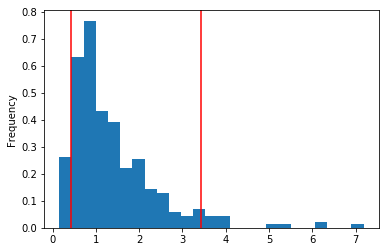

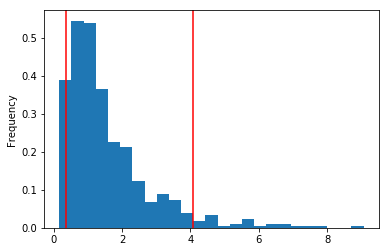

In [32]:
i=0
for x in range(0,5500,500):
    confidence_interval = yr5_returns.iloc[x:x+500].quantile(q=[0.05, 0.95])

    plt.figure();
    yr5_returns.iloc[x:x+500].plot(kind='hist', density=True, bins=25)
    plt.axvline(confidence_interval.iloc[0], color='r')
    plt.axvline(confidence_interval.iloc[1], color='r')
#     plt.savefig(f'./output/opt_hist{i}.png', bbox_inches='tight', dpi=150)
    i+=10

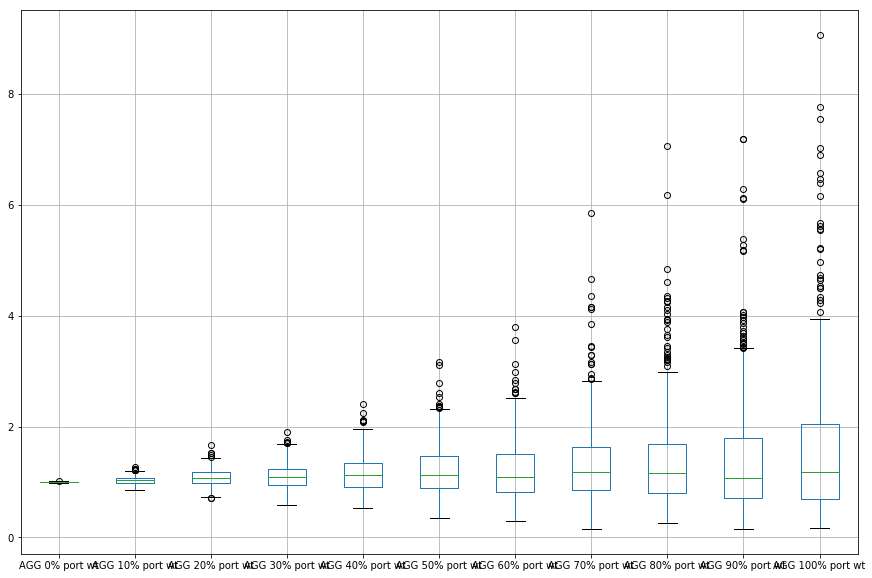

In [28]:
df2=pd.DataFrame()
yr5=yr5_returns.tolist()
i=0

for y in range(0,5500,500):
    lst3=[]
    for x in range (y,y+500):
        lst3.append(yr5[x])
    df2[f'AGG {i}% port wt']=pd.Series(lst3)
    i+=10
        

boxplot = df2.boxplot(figsize=(15,10))
# boxplot.figure.savefig(f'./output/boxplot.png', bbox_inches='tight', dpi=150) 

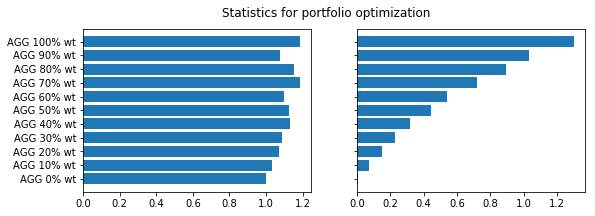

In [29]:
i=0
lst50pct=[]
lststd=[]
lstt=[]

for x in range(0,5500,500):
    lst50pct.append(yr5_returns.iloc[x:x+500].quantile(0.5, interpolation='nearest'))
    lststd.append(yr5_returns.iloc[x:x+500].std())
    lstt.append(f'AGG {i}% wt')
    i+=10
            
        
fig, axs = plt.subplots(1, 2, figsize=(9, 3), sharey=True)
axs[0].barh(lstt, lst50pct)
axs[1].barh(lstt, lststd)
fig.suptitle('Statistics for portfolio optimization')         
# plt.savefig(f'./output/optMC_stats.png', bbox_inches='tight', dpi=150)




In [37]:
opt_con=pd.DataFrame(lstt)
opt_cut=[]
opt_cutt=[]
for x in range(0,5500,500):
    opt_cut_row=[]  
    for z in range(20,110,10):
        cut=[]
        for y in range(x,x+500):
            if (.04*z*1000*yr5[y])>=7389:
                cut.append(yr5[y])
        opt_cut_row.append(round((len(cut)/500)*100,2))
    opt_cut.append(opt_cut_row)
opt_con=pd.DataFrame(opt_cut)
opt_con.columns=['20k initial','30k initial','40k initial','50k initial','60k initial','70k initial','80k initial','90k initial','100k initial']
opt_con['weight']=pd.Series(lstt)
opt_con.set_index('weight', inplace=True)
opt_con

# fig, ax = plt.subplots(1,1)
# ax.xaxis.set_visible(False) 
# ax.yaxis.set_visible(False) 
# ax.set_frame_on(False) 
# table(ax, opt_con,loc='center')
# fig.savefig('./output/top_con.png')
        

,20k initial,30k initial,40k initial,50k initial,60k initial,70k initial,80k initial,90k initial,100k initial
weight,,,,,,,,,
AGG 0% wt,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
AGG 10% wt,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
AGG 20% wt,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
AGG 30% wt,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.2
AGG 40% wt,0.0,0.0,0.0,0.0,0.0,0.0,0.2,1.2,2.6
AGG 50% wt,0.0,0.0,0.0,0.0,0.4,0.6,2.2,5.4,8.8
AGG 60% wt,0.0,0.0,0.0,0.2,0.6,1.6,5.0,7.4,12.6
AGG 70% wt,0.0,0.0,0.4,1.4,2.8,4.8,9.6,12.6,18.2
AGG 80% wt,0.0,0.4,0.6,3.0,5.6,8.2,13.8,17.8,21.0
